# DISCLAIMER
Los datos utilizados en este notebook son del dataset: https://huggingface.co/datasets/pollitoconpapass/dataset-peru-shazam

Para saber como se obtuvieron las canciones visitar el siguiente enlace: https://github.com/pollitoconpapass/chichazam-ml/tree/master/recoleccion_datos

# Objetivo: Construyendo Shazam para la Música Peruana

Nuestros datos son de canciones peruanas de 5 géneros: huayno, cumbia amazónica, chicha, criolla y rock.

El objetivo principal de este notebook es sentar la base analítica y exploratoria para el desarrollo de un sistema de identificación musical, similar a Shazam, enfocado en la música peruana. Esto implica:

1.  Identificación de Canciones (Audio Fingerprinting): Determinar cómo diferenciar y reconocer canciones específicas a partir de fragmentos de audio en streaming cuando estas ya se encuentran en nuestra base de datos.
2.  Clasificación de Género y Recomendación: Para las canciones que no estén en nuestra base de datos, el sistema deberá ser capaz de identificar su género musical y, a partir de esto, recomendar canciones similares utilizando técnicas de audio embeddings.

En este sentido, exploraremos los datos para entender las características distintivas de cada género y cómo estas pueden ser utilizadas para los objetivos de identificación y recomendación.

In [1]:
!pip install datasets soundfile librosa matplotlib seaborn

In [2]:
from datasets import load_dataset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Carga del dataset y exploracion inicial

In [3]:
# Cargar el JSON de metadata
catalog_dataset = load_dataset("pollitoconpapass/dataset-peru-shazam", data_files="catalog.json")

# Extraer el contenido y convertirlo a dataframe
json_content = catalog_dataset['train'][0]
df_metadata = pd.DataFrame.from_dict(json_content, orient='index')

README.md:   0%|          | 0.00/2.67k [00:00<?, ?B/s]

catalog.json:   0%|          | 0.00/133k [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [4]:
print("--- Primeras filas del catálogo ---")
display(df_metadata.head())

--- Primeras filas del catálogo ---


,id,title,duration_seconds,genre,filename,source_url,status,discovered_at,downloaded_at,error
R0V41zBH2xY,R0V41zBH2xY,Que linda flor - Silverio Urbina,252,huayno,R0V41zBH2xY.wav,https://www.youtube.com/watch?v=R0V41zBH2xY,downloaded,2026-09-22T16:04:13.743392+00:00,2026-09-22T17:11:16.063261+00:00,None
mUoVKG9Or-E,mUoVKG9Or-E,EUSEBIO CHATO GRADOS - EL PIO PIO,218,huayno,mUoVKG9Or-E.wav,https://www.youtube.com/watch?v=mUoVKG9Or-E,downloaded,2026-09-22T16:04:13.743402+00:00,2026-09-22T17:11:59.938185+00:00,None
aB1b4AmZK0Y,aB1b4AmZK0Y,rosita de espinar suspiros de amor,293,huayno,aB1b4AmZK0Y.wav,https://www.youtube.com/watch?v=aB1b4AmZK0Y,downloaded,2026-09-22T16:04:13.743405+00:00,2026-09-22T17:12:33.101583+00:00,None
d4X687NPmtU,d4X687NPmtU,Los Huaycheños Mix Pandilla,593,huayno,d4X687NPmtU.wav,https://www.youtube.com/watch?v=d4X687NPmtU,downloaded,2026-09-22T16:04:13.743408+00:00,2026-09-22T17:13:07.179514+00:00,None
xTo-SbDMcFw,xTo-SbDMcFw,EUSEBIO CHATO GRADOS EN MACHU PICCHU - HUAYLAS...,233,huayno,xTo-SbDMcFw.wav,https://www.youtube.com/watch?v=xTo-SbDMcFw,downloaded,2026-09-22T16:04:13.743410+00:00,2026-09-22T17:13:54.056087+00:00,None


In [5]:
print("\nInformación general del dataset:")
print(df_metadata.info())


Información general del dataset:
<class 'pandas.core.frame.DataFrame'>
Index: 322 entries, R0V41zBH2xY to 6c34H2zAWuc
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                322 non-null    object
 1   title             322 non-null    object
 2   duration_seconds  322 non-null    int64 
 3   genre             322 non-null    object
 4   filename          322 non-null    object
 5   source_url        322 non-null    object
 6   status            322 non-null    object
 7   discovered_at     322 non-null    object
 8   downloaded_at     318 non-null    object
 9   error             4 non-null      object
dtypes: int64(1), object(9)
memory usage: 27.7+ KB
None


In [6]:
from datasets import load_dataset
import pandas as pd

# Filtrar solo las que tienen el status: downloaded
catalog_dataset = load_dataset("pollitoconpapass/dataset-peru-shazam", data_files="catalog.json")
json_content = catalog_dataset['train'][0]
df_metadata = pd.DataFrame.from_dict(json_content, orient='index')

df_validos = df_metadata[(df_metadata['status'] == 'downloaded') & (df_metadata['error'].isnull())]
print(f"Canciones válidas según el JSON: {len(df_validos)}")

# Cargar dataset de audios (datos de los audios como tal, ya no la metadata)
ds_audio = load_dataset("pollitoconpapass/dataset-peru-shazam")
audio_split = ds_audio['train'] if 'train' in ds_audio else ds_audio

# Consultar que columnas tiene el dataset
print("\nColumnas en el dataset de audio:", audio_split.column_names)

# Primera muestra de un audio
primer_audio = audio_split[0]
print("\nEjemplo de un registro de audio:", {k: type(v) for k, v in primer_audio.items()})

Canciones válidas según el JSON: 318


Resolving data files:   0%|          | 0/319 [00:00<?, ?it/s]

audio/-GyHw_K1DEs.wav: reconstructing file:   0%|          |  0.00B / 8.85MB            

audio/1fovLQVa5BY.wav: reconstructing file:   0%|          |  0.00B / 10.4MB            

audio/1uf8CJXR_UE.wav: reconstructing file:   0%|          |  0.00B / 10.4MB            

audio/1oInM3htHgI.wav: reconstructing file:   0%|          |  0.00B / 16.4MB            

audio/1dMyHwf3BBQ.wav: reconstructing file:   0%|          |  0.00B / 9.11MB            

audio/1jsKuDiVaIk.wav: reconstructing file:   0%|          |  0.00B / 7.88MB            

audio/0RZMoZSUSsA.wav: reconstructing file:   0%|          |  0.00B / 11.2MB            

audio/14sumWTyjyg.wav: reconstructing file:   0%|          |  0.00B / 7.16MB            

audio/-hBEugo_hX8.wav: reconstructing file:   0%|          |  0.00B / 8.73MB            

audio/2HEuMAg-qmQ.wav: reconstructing file:   0%|          |  0.00B / 9.46MB            

audio/-WSsvhcpx0c.wav: reconstructing file:   0%|          |  0.00B / 12.4MB            

audio/-QcvmQfFQ0M.wav: reconstructing file:   0%|          |  0.00B / 8.59MB            

audio/0u9XSYK9Wx4.wav: reconstructing file:   0%|          |  0.00B / 11.4MB            

audio/17dFNf0fcc0.wav: reconstructing file:   0%|          |  0.00B / 9.84MB            

audio/2LwgbKxBvVA.wav: reconstructing file:   0%|          |  0.00B / 8.91MB            

audio/2WxKpkWOE5k.wav: reconstructing file:   0%|          |  0.00B / 12.0MB            

audio/1fovLQVa5BY.wav: downloading bytes:           |  0.00B            

audio/14sumWTyjyg.wav: downloading bytes:           |  0.00B            

audio/1dMyHwf3BBQ.wav: downloading bytes:           |  0.00B            

audio/1uf8CJXR_UE.wav: downloading bytes:           |  0.00B            

audio/-GyHw_K1DEs.wav: downloading bytes:           |  0.00B            

audio/2HEuMAg-qmQ.wav: downloading bytes:           |  0.00B            

audio/0RZMoZSUSsA.wav: downloading bytes:           |  0.00B            

audio/1oInM3htHgI.wav: downloading bytes:           |  0.00B            

audio/1jsKuDiVaIk.wav: downloading bytes:           |  0.00B            

audio/-hBEugo_hX8.wav: downloading bytes:           |  0.00B            

audio/0u9XSYK9Wx4.wav: downloading bytes:           |  0.00B            

audio/-QcvmQfFQ0M.wav: downloading bytes:           |  0.00B            

audio/2LwgbKxBvVA.wav: downloading bytes:           |  0.00B            

audio/2WxKpkWOE5k.wav: downloading bytes:           |  0.00B            

audio/17dFNf0fcc0.wav: downloading bytes:           |  0.00B            

audio/-WSsvhcpx0c.wav: downloading bytes:           |  0.00B            

audio/2YkV-2vuG_o.wav: reconstructing file:   0%|          |  0.00B / 9.06MB            

audio/2YkV-2vuG_o.wav: downloading bytes:           |  0.00B            

audio/2laMciQkDyg.wav: reconstructing file:   0%|          |  0.00B / 11.9MB            

audio/2oKXHWGulk0.wav: reconstructing file:   0%|          |  0.00B / 8.41MB            

audio/2laMciQkDyg.wav: downloading bytes:           |  0.00B            

audio/2oKXHWGulk0.wav: downloading bytes:           |  0.00B            

audio/2r0i-sPX3bM.wav: reconstructing file:   0%|          |  0.00B / 6.41MB            

audio/2r0i-sPX3bM.wav: downloading bytes:           |  0.00B            

audio/3GlZposTd0g.wav: reconstructing file:   0%|          |  0.00B / 8.28MB            

audio/3GlZposTd0g.wav: downloading bytes:           |  0.00B            

audio/3HBkatK-42Y.wav: reconstructing file:   0%|          |  0.00B / 9.09MB            

audio/3HBkatK-42Y.wav: downloading bytes:           |  0.00B            

audio/3O1GsKSvdJM.wav: reconstructing file:   0%|          |  0.00B / 7.05MB            

audio/3O1GsKSvdJM.wav: downloading bytes:           |  0.00B            

audio/3SoRvPGA9hY.wav: reconstructing file:   0%|          |  0.00B / 7.31MB            

audio/3_7P8NmLEVc.wav: reconstructing file:   0%|          |  0.00B / 8.11MB            

audio/3g5qFH7WT-o.wav: reconstructing file:   0%|          |  0.00B / 9.44MB            

audio/3SoRvPGA9hY.wav: downloading bytes:           |  0.00B            

audio/3_7P8NmLEVc.wav: downloading bytes:           |  0.00B            

audio/3_ny6laeB9Y.wav: reconstructing file:   0%|          |  0.00B / 6.01MB            

audio/3g5qFH7WT-o.wav: downloading bytes:           |  0.00B            

audio/3mXACZQn9_Y.wav: reconstructing file:   0%|          |  0.00B / 9.78MB            

audio/3k6qxhGyygU.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/3_ny6laeB9Y.wav: downloading bytes:           |  0.00B            

audio/3k6qxhGyygU.wav: downloading bytes:           |  0.00B            

audio/3mXACZQn9_Y.wav: downloading bytes:           |  0.00B            

audio/4AsyT0SxZpA.wav: reconstructing file:   0%|          |  0.00B / 20.9MB            

audio/4AsyT0SxZpA.wav: downloading bytes:           |  0.00B            

audio/4B2nZ7LcH6s.wav: reconstructing file:   0%|          |  0.00B / 7.67MB            

audio/4B2nZ7LcH6s.wav: downloading bytes:           |  0.00B            

audio/4oZdtKk5kpY.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/4qknzZc4mOs.wav: reconstructing file:   0%|          |  0.00B / 8.46MB            

audio/52PKK6N1hW4.wav: reconstructing file:   0%|          |  0.00B / 9.14MB            

audio/4oZdtKk5kpY.wav: downloading bytes:           |  0.00B            

audio/4qknzZc4mOs.wav: downloading bytes:           |  0.00B            

audio/5JfmoqNZ6Mo.wav: reconstructing file:   0%|          |  0.00B / 8.76MB            

audio/52PKK6N1hW4.wav: downloading bytes:           |  0.00B            

audio/5vZVe39rbnc.wav: reconstructing file:   0%|          |  0.00B / 12.7MB            

audio/65LbVOSWFR4.wav: reconstructing file:   0%|          |  0.00B / 8.52MB            

audio/5JfmoqNZ6Mo.wav: downloading bytes:           |  0.00B            

audio/699zr1wWK2Q.wav: reconstructing file:   0%|          |  0.00B / 11.5MB            

audio/66ri6m45aZ8.wav: reconstructing file:   0%|          |  0.00B / 10.6MB            

audio/65LbVOSWFR4.wav: downloading bytes:           |  0.00B            

audio/5vZVe39rbnc.wav: downloading bytes:           |  0.00B            

audio/699zr1wWK2Q.wav: downloading bytes:           |  0.00B            

audio/6c34H2zAWuc.wav: reconstructing file:   0%|          |  0.00B / 10.8MB            

audio/66ri6m45aZ8.wav: downloading bytes:           |  0.00B            

audio/6wuXcGYwJa8.wav: reconstructing file:   0%|          |  0.00B / 7.36MB            

audio/6c34H2zAWuc.wav: downloading bytes:           |  0.00B            

audio/6wuXcGYwJa8.wav: downloading bytes:           |  0.00B            

audio/73BRcwYqDOE.wav: reconstructing file:   0%|          |  0.00B / 11.8MB            

audio/74OxZjBp_oM.wav: reconstructing file:   0%|          |  0.00B / 9.93MB            

audio/73BRcwYqDOE.wav: downloading bytes:           |  0.00B            

audio/74OxZjBp_oM.wav: downloading bytes:           |  0.00B            

audio/7WygFiY2Hjw.wav: reconstructing file:   0%|          |  0.00B / 7.41MB            

audio/7StUeqlTsLo.wav: reconstructing file:   0%|          |  0.00B / 11.7MB            

audio/8-TW54uBYVQ.wav: reconstructing file:   0%|          |  0.00B / 9.21MB            

audio/7jQWidqI8yc.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/7WygFiY2Hjw.wav: downloading bytes:           |  0.00B            

audio/7StUeqlTsLo.wav: downloading bytes:           |  0.00B            

audio/8-TW54uBYVQ.wav: downloading bytes:           |  0.00B            

audio/8eJlLZmjRQ4.wav: reconstructing file:   0%|          |  0.00B / 16.1MB            

audio/93njIBBOsao.wav: reconstructing file:   0%|          |  0.00B / 9.70MB            

audio/7p5NM480NcY.wav: reconstructing file:   0%|          |  0.00B / 9.58MB            

audio/9nnpjWg7PFk.wav: reconstructing file:   0%|          |  0.00B / 9.59MB            

audio/9laBog7bJcE.wav: reconstructing file:   0%|          |  0.00B / 10.8MB            

audio/7jQWidqI8yc.wav: downloading bytes:           |  0.00B            

audio/8eJlLZmjRQ4.wav: downloading bytes:           |  0.00B            

audio/9t5ZcH1kmAo.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/9roNczSR7iI.wav: reconstructing file:   0%|          |  0.00B / 10.8MB            

audio/93njIBBOsao.wav: downloading bytes:           |  0.00B            

audio/9nnpjWg7PFk.wav: downloading bytes:           |  0.00B            

audio/7p5NM480NcY.wav: downloading bytes:           |  0.00B            

audio/9laBog7bJcE.wav: downloading bytes:           |  0.00B            

audio/9t5ZcH1kmAo.wav: downloading bytes:           |  0.00B            

audio/Ansjd3TDuc0.wav: reconstructing file:   0%|          |  0.00B / 11.6MB            

audio/9xgCNtlNR18.wav: reconstructing file:   0%|          |  0.00B / 9.86MB            

audio/AAjCWGT8UDE.wav: reconstructing file:   0%|          |  0.00B / 10.2MB            

audio/9roNczSR7iI.wav: downloading bytes:           |  0.00B            

audio/9uZW1In38gA.wav: reconstructing file:   0%|          |  0.00B / 6.97MB            

audio/Ay8Nd9vZ2KA.wav: reconstructing file:   0%|          |  0.00B / 13.7MB            

audio/BCUeYWDFHAg.wav: reconstructing file:   0%|          |  0.00B / 14.9MB            

audio/9xgCNtlNR18.wav: downloading bytes:           |  0.00B            

audio/9uZW1In38gA.wav: downloading bytes:           |  0.00B            

audio/Ansjd3TDuc0.wav: downloading bytes:           |  0.00B            

audio/AAjCWGT8UDE.wav: downloading bytes:           |  0.00B            

audio/Ay8Nd9vZ2KA.wav: downloading bytes:           |  0.00B            

audio/BCUeYWDFHAg.wav: downloading bytes:           |  0.00B            

audio/BPv_jBGSi4A.wav: reconstructing file:   0%|          |  0.00B / 9.35MB            

audio/BPv_jBGSi4A.wav: downloading bytes:           |  0.00B            

audio/BRdh6LhFFyg.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/BRdh6LhFFyg.wav: downloading bytes:           |  0.00B            

audio/BvP615QRjQk.wav: reconstructing file:   0%|          |  0.00B / 9.57MB            

audio/BvP615QRjQk.wav: downloading bytes:           |  0.00B            

audio/C6wR5pEn9EI.wav: reconstructing file:   0%|          |  0.00B / 8.88MB            

audio/CobDcWHv_yI.wav: reconstructing file:   0%|          |  0.00B / 8.89MB            

audio/Cu-tiFLDAsU.wav: reconstructing file:   0%|          |  0.00B / 9.96MB            

audio/C6wR5pEn9EI.wav: downloading bytes:           |  0.00B            

audio/CwnyaMFDK7Y.wav: reconstructing file:   0%|          |  0.00B / 8.89MB            

audio/D7GWhafwXhk.wav: reconstructing file:   0%|          |  0.00B / 16.8MB            

audio/CobDcWHv_yI.wav: downloading bytes:           |  0.00B            

audio/D7llQhZbtek.wav: reconstructing file:   0%|          |  0.00B / 7.46MB            

audio/D7GWhafwXhk.wav: downloading bytes:           |  0.00B            

audio/Cu-tiFLDAsU.wav: downloading bytes:           |  0.00B            

audio/CwnyaMFDK7Y.wav: downloading bytes:           |  0.00B            

audio/DYcL_SuX6mo.wav: reconstructing file:   0%|          |  0.00B / 9.59MB            

audio/DbFG_ZSrzKU.wav: reconstructing file:   0%|          |  0.00B / 8.87MB            

audio/E3YODAH_838.wav: reconstructing file:   0%|          |  0.00B / 8.72MB            

audio/El3NyL2l96g.wav: reconstructing file:   0%|          |  0.00B / 7.85MB            

audio/EnMcYWG1Yyc.wav: reconstructing file:   0%|          |  0.00B / 7.42MB            

audio/EwT3K-aVhbk.wav: reconstructing file:   0%|          |  0.00B / 7.80MB            

audio/FaT3Fdsiyu0.wav: reconstructing file:   0%|          |  0.00B / 8.17MB            

audio/FoPQR6M88BQ.wav: reconstructing file:   0%|          |  0.00B / 7.70MB            

audio/Fq2-Eil987E.wav: reconstructing file:   0%|          |  0.00B / 13.5MB            

audio/D7llQhZbtek.wav: downloading bytes:           |  0.00B            

audio/Fqvu6X15ZLA.wav: reconstructing file:   0%|          |  0.00B / 7.91MB            

audio/DbFG_ZSrzKU.wav: downloading bytes:           |  0.00B            

audio/DYcL_SuX6mo.wav: downloading bytes:           |  0.00B            

audio/E3YODAH_838.wav: downloading bytes:           |  0.00B            

audio/El3NyL2l96g.wav: downloading bytes:           |  0.00B            

audio/EnMcYWG1Yyc.wav: downloading bytes:           |  0.00B            

audio/GBwGNu7Mi2k.wav: reconstructing file:   0%|          |  0.00B / 10.3MB            

audio/EwT3K-aVhbk.wav: downloading bytes:           |  0.00B            

audio/FaT3Fdsiyu0.wav: downloading bytes:           |  0.00B            

audio/Fqvu6X15ZLA.wav: downloading bytes:           |  0.00B            

audio/FoPQR6M88BQ.wav: downloading bytes:           |  0.00B            

audio/Fq2-Eil987E.wav: downloading bytes:           |  0.00B            

audio/GBwGNu7Mi2k.wav: downloading bytes:           |  0.00B            

audio/GWT_43nat3E.wav: reconstructing file:   0%|          |  0.00B / 8.73MB            

audio/GWT_43nat3E.wav: downloading bytes:           |  0.00B            

audio/Gq96rM7Mxn4.wav: reconstructing file:   0%|          |  0.00B / 9.53MB            

audio/Gq96rM7Mxn4.wav: downloading bytes:           |  0.00B            

audio/GuyyddWdC2w.wav: reconstructing file:   0%|          |  0.00B / 12.3MB            

audio/H1XnuLMuEcA.wav: reconstructing file:   0%|          |  0.00B / 10.5MB            

audio/HIXYx6cgwT8.wav: reconstructing file:   0%|          |  0.00B / 8.45MB            

audio/H9AGh_rvf9A.wav: reconstructing file:   0%|          |  0.00B / 7.61MB            

audio/GuyyddWdC2w.wav: downloading bytes:           |  0.00B            

audio/HW20Ixcbysg.wav: reconstructing file:   0%|          |  0.00B / 8.01MB            

audio/H1XnuLMuEcA.wav: downloading bytes:           |  0.00B            

audio/H9AGh_rvf9A.wav: downloading bytes:           |  0.00B            

audio/HIXYx6cgwT8.wav: downloading bytes:           |  0.00B            

audio/H_RRQDnddjE.wav: reconstructing file:   0%|          |  0.00B / 17.9MB            

audio/HWd-G2i8WNk.wav: reconstructing file:   0%|          |  0.00B / 6.96MB            

audio/IeXi_VIdM7M.wav: reconstructing file:   0%|          |  0.00B / 8.45MB            

audio/IQ0GozQk4_w.wav: reconstructing file:   0%|          |  0.00B / 9.09MB            

audio/HW20Ixcbysg.wav: downloading bytes:           |  0.00B            

audio/HaczI06YDfc.wav: reconstructing file:   0%|          |  0.00B / 9.79MB            

audio/IwbCZXckwd4.wav: reconstructing file:   0%|          |  0.00B / 6.60MB            

audio/IopKZblu63Y.wav: reconstructing file:   0%|          |  0.00B / 11.5MB            

audio/J-XWmeW0HsQ.wav: reconstructing file:   0%|          |  0.00B / 9.03MB            

audio/JL-N2jTqps0.wav: reconstructing file:   0%|          |  0.00B / 9.72MB            

audio/JH66dwDEMOU.wav: reconstructing file:   0%|          |  0.00B / 6.81MB            

audio/J_IRbpfy6jc.wav: reconstructing file:   0%|          |  0.00B / 7.99MB            

audio/H_RRQDnddjE.wav: downloading bytes:           |  0.00B            

audio/HWd-G2i8WNk.wav: downloading bytes:           |  0.00B            

audio/IQ0GozQk4_w.wav: downloading bytes:           |  0.00B            

audio/IeXi_VIdM7M.wav: downloading bytes:           |  0.00B            

audio/IopKZblu63Y.wav: downloading bytes:           |  0.00B            

audio/HaczI06YDfc.wav: downloading bytes:           |  0.00B            

audio/IwbCZXckwd4.wav: downloading bytes:           |  0.00B            

audio/JurdaGHHQfA.wav: reconstructing file:   0%|          |  0.00B / 7.44MB            

audio/JL-N2jTqps0.wav: downloading bytes:           |  0.00B            

audio/J-XWmeW0HsQ.wav: downloading bytes:           |  0.00B            

audio/JH66dwDEMOU.wav: downloading bytes:           |  0.00B            

audio/J_IRbpfy6jc.wav: downloading bytes:           |  0.00B            

audio/JurdaGHHQfA.wav: downloading bytes:           |  0.00B            

audio/KK6wrOkxMC8.wav: reconstructing file:   0%|          |  0.00B / 8.49MB            

audio/KK6wrOkxMC8.wav: downloading bytes:           |  0.00B            

audio/KvoPjO3PfbQ.wav: reconstructing file:   0%|          |  0.00B / 13.2MB            

audio/KxLpddd20nY.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/KvoPjO3PfbQ.wav: downloading bytes:           |  0.00B            

audio/KxLpddd20nY.wav: downloading bytes:           |  0.00B            

audio/KxfmbELnfCY.wav: reconstructing file:   0%|          |  0.00B / 8.43MB            

audio/KxfmbELnfCY.wav: downloading bytes:           |  0.00B            

audio/L0CrdIqGTAI.wav: reconstructing file:   0%|          |  0.00B / 8.72MB            

audio/L0CrdIqGTAI.wav: downloading bytes:           |  0.00B            

audio/Llfm0VzY5u4.wav: reconstructing file:   0%|          |  0.00B / 7.65MB            

audio/LDEycYin108.wav: reconstructing file:   0%|          |  0.00B / 8.91MB            

audio/MCggolkmfwY.wav: reconstructing file:   0%|          |  0.00B / 12.6MB            

audio/MjrBOXhZ4G0.wav: reconstructing file:   0%|          |  0.00B / 6.93MB            

audio/Mdr2clzaruc.wav: reconstructing file:   0%|          |  0.00B / 7.78MB            

audio/MYNXyMUxtRc.wav: reconstructing file:   0%|          |  0.00B / 8.46MB            

audio/MZdYbhdu6Pg.wav: reconstructing file:   0%|          |  0.00B / 13.3MB            

audio/N-q4Tch_E30.wav: reconstructing file:   0%|          |  0.00B / 8.60MB            

audio/Llfm0VzY5u4.wav: downloading bytes:           |  0.00B            

audio/NYJkCP0iLeM.wav: reconstructing file:   0%|          |  0.00B / 8.76MB            

audio/N-sBlN9JK24.wav: reconstructing file:   0%|          |  0.00B / 11.0MB            

audio/NVO795V7ZIg.wav: reconstructing file:   0%|          |  0.00B / 26.3MB            

audio/LDEycYin108.wav: downloading bytes:           |  0.00B            

audio/MCggolkmfwY.wav: downloading bytes:           |  0.00B            

audio/O7nHVN5oCT0.wav: reconstructing file:   0%|          |  0.00B / 8.40MB            

audio/Nx3XGW1slFc.wav: reconstructing file:   0%|          |  0.00B / 11.7MB            

audio/OSFpm2Dr5EY.wav: reconstructing file:   0%|          |  0.00B / 8.17MB            

audio/NbwIldlnXaU.wav: reconstructing file:   0%|          |  0.00B / 8.18MB            

audio/OPVwjiDRBQs.wav: reconstructing file:   0%|          |  0.00B / 12.0MB            

audio/MjrBOXhZ4G0.wav: downloading bytes:           |  0.00B            

audio/MZdYbhdu6Pg.wav: downloading bytes:           |  0.00B            

audio/MYNXyMUxtRc.wav: downloading bytes:           |  0.00B            

audio/Mdr2clzaruc.wav: downloading bytes:           |  0.00B            

audio/N-sBlN9JK24.wav: downloading bytes:           |  0.00B            

audio/O7nHVN5oCT0.wav: downloading bytes:           |  0.00B            

audio/NbwIldlnXaU.wav: downloading bytes:           |  0.00B            

audio/NYJkCP0iLeM.wav: downloading bytes:           |  0.00B            

audio/Nx3XGW1slFc.wav: downloading bytes:           |  0.00B            

audio/NVO795V7ZIg.wav: downloading bytes:           |  0.00B            

audio/OPVwjiDRBQs.wav: downloading bytes:           |  0.00B            

audio/N-q4Tch_E30.wav: downloading bytes:           |  0.00B            

audio/OSFpm2Dr5EY.wav: downloading bytes:           |  0.00B            

audio/P2-gGSTvepA.wav: reconstructing file:   0%|          |  0.00B / 7.90MB            

audio/OiC9HwNkw14.wav: reconstructing file:   0%|          |  0.00B / 8.34MB            

audio/P2-gGSTvepA.wav: downloading bytes:           |  0.00B            

audio/OiC9HwNkw14.wav: downloading bytes:           |  0.00B            

audio/PHPQbHjWGfs.wav: reconstructing file:   0%|          |  0.00B / 10.5MB            

audio/PHPQbHjWGfs.wav: downloading bytes:           |  0.00B            

audio/PUCDKNWlg08.wav: reconstructing file:   0%|          |  0.00B / 14.1MB            

audio/PUCDKNWlg08.wav: downloading bytes:           |  0.00B            

audio/PY4rYwLNZf8.wav: reconstructing file:   0%|          |  0.00B / 11.4MB            

audio/PcEQbInf2NI.wav: reconstructing file:   0%|          |  0.00B / 8.56MB            

audio/PY4rYwLNZf8.wav: downloading bytes:           |  0.00B            

audio/PcEQbInf2NI.wav: downloading bytes:           |  0.00B            

audio/PtqjYn0XnfI.wav: reconstructing file:   0%|          |  0.00B / 10.3MB            

audio/PtqjYn0XnfI.wav: downloading bytes:           |  0.00B            

audio/QDMohnXB86E.wav: reconstructing file:   0%|          |  0.00B / 8.49MB            

audio/QbwgYSP4gQw.wav: reconstructing file:   0%|          |  0.00B / 7.70MB            

audio/QTkVTHJXWEY.wav: reconstructing file:   0%|          |  0.00B / 8.36MB            

audio/Ql53mBGnfkg.wav: reconstructing file:   0%|          |  0.00B / 6.74MB            

audio/QxZvGJlZ8ZQ.wav: reconstructing file:   0%|          |  0.00B / 10.3MB            

audio/R0GGIJzacys.wav: reconstructing file:   0%|          |  0.00B / 14.6MB            

audio/QbwgYSP4gQw.wav: downloading bytes:           |  0.00B            

audio/R0V41zBH2xY.wav: reconstructing file:   0%|          |  0.00B / 11.1MB            

audio/QTkVTHJXWEY.wav: downloading bytes:           |  0.00B            

audio/Ql53mBGnfkg.wav: downloading bytes:           |  0.00B            

audio/RA4e2IG7xLY.wav: reconstructing file:   0%|          |  0.00B / 8.71MB            

audio/RJBIcSQpSYI.wav: reconstructing file:   0%|          |  0.00B / 9.04MB            

audio/QDMohnXB86E.wav: downloading bytes:           |  0.00B            

audio/R0GGIJzacys.wav: downloading bytes:           |  0.00B            

audio/RLgDvU3JpKI.wav: reconstructing file:   0%|          |  0.00B / 10.5MB            

audio/QxZvGJlZ8ZQ.wav: downloading bytes:           |  0.00B            

audio/SNolXEbYDJ4.wav: reconstructing file:   0%|          |  0.00B / 11.9MB            

audio/SBwfPKgicl0.wav: reconstructing file:   0%|          |  0.00B / 10.9MB            

audio/ScAUv5yRAoA.wav: reconstructing file:   0%|          |  0.00B / 9.93MB            

audio/SB2Q8IrkfWU.wav: reconstructing file:   0%|          |  0.00B / 7.05MB            

audio/R0V41zBH2xY.wav: downloading bytes:           |  0.00B            

audio/SvmiFL96kTc.wav: reconstructing file:   0%|          |  0.00B / 16.9MB            

audio/RA4e2IG7xLY.wav: downloading bytes:           |  0.00B            

audio/RLgDvU3JpKI.wav: downloading bytes:           |  0.00B            

audio/ScAUv5yRAoA.wav: downloading bytes:           |  0.00B            

audio/RJBIcSQpSYI.wav: downloading bytes:           |  0.00B            

audio/SB2Q8IrkfWU.wav: downloading bytes:           |  0.00B            

audio/SNolXEbYDJ4.wav: downloading bytes:           |  0.00B            

audio/SBwfPKgicl0.wav: downloading bytes:           |  0.00B            

audio/SvmiFL96kTc.wav: downloading bytes:           |  0.00B            

audio/T-jmO8u8rEQ.wav: reconstructing file:   0%|          |  0.00B / 7.94MB            

audio/T-jmO8u8rEQ.wav: downloading bytes:           |  0.00B            

audio/TOmUsc5qc_4.wav: reconstructing file:   0%|          |  0.00B / 9.78MB            

audio/TOmUsc5qc_4.wav: downloading bytes:           |  0.00B            

audio/TQ_4zU0v7Bc.wav: reconstructing file:   0%|          |  0.00B / 10.4MB            

audio/TZKGflccfI0.wav: reconstructing file:   0%|          |  0.00B / 8.21MB            

audio/TosVndixdwo.wav: reconstructing file:   0%|          |  0.00B / 9.29MB            

audio/Ta_uWsIwTCA.wav: reconstructing file:   0%|          |  0.00B / 9.88MB            

audio/TuV-OL8jctM.wav: reconstructing file:   0%|          |  0.00B / 7.94MB            

audio/TyetdP_okpI.wav: reconstructing file:   0%|          |  0.00B / 13.0MB            

audio/TqJ4Zy4RKro.wav: reconstructing file:   0%|          |  0.00B / 9.02MB            

audio/TQ_4zU0v7Bc.wav: downloading bytes:           |  0.00B            

audio/UUHqqrnGFmw.wav: reconstructing file:   0%|          |  0.00B / 8.79MB            

audio/UJ-5PEBhi2c.wav: reconstructing file:   0%|          |  0.00B / 8.85MB            

audio/UogJoHWQ1rA.wav: reconstructing file:   0%|          |  0.00B / 13.2MB            

audio/TZKGflccfI0.wav: downloading bytes:           |  0.00B            

audio/TosVndixdwo.wav: downloading bytes:           |  0.00B            

audio/V-LMWyrfu1I.wav: reconstructing file:   0%|          |  0.00B / 9.87MB            

audio/UujLSMj1rtg.wav: reconstructing file:   0%|          |  0.00B / 12.1MB            

audio/Ta_uWsIwTCA.wav: downloading bytes:           |  0.00B            

audio/TuV-OL8jctM.wav: downloading bytes:           |  0.00B            

audio/VUM8pzErYCg.wav: reconstructing file:   0%|          |  0.00B / 12.9MB            

audio/VBUsx_AQHcY.wav: reconstructing file:   0%|          |  0.00B / 11.9MB            

audio/V9xAMlQP9tE.wav: reconstructing file:   0%|          |  0.00B / 8.56MB            

audio/TyetdP_okpI.wav: downloading bytes:           |  0.00B            

audio/TqJ4Zy4RKro.wav: downloading bytes:           |  0.00B            

audio/UUHqqrnGFmw.wav: downloading bytes:           |  0.00B            

audio/UujLSMj1rtg.wav: downloading bytes:           |  0.00B            

audio/UogJoHWQ1rA.wav: downloading bytes:           |  0.00B            

audio/V-LMWyrfu1I.wav: downloading bytes:           |  0.00B            

audio/UJ-5PEBhi2c.wav: downloading bytes:           |  0.00B            

audio/VBUsx_AQHcY.wav: downloading bytes:           |  0.00B            

audio/VUM8pzErYCg.wav: downloading bytes:           |  0.00B            

audio/V9xAMlQP9tE.wav: downloading bytes:           |  0.00B            

audio/Vgepf1EKoPg.wav: reconstructing file:   0%|          |  0.00B / 8.22MB            

audio/Vgepf1EKoPg.wav: downloading bytes:           |  0.00B            

audio/Vh_0pcytVWA.wav: reconstructing file:   0%|          |  0.00B / 9.90MB            

audio/Vh_0pcytVWA.wav: downloading bytes:           |  0.00B            

audio/VmB9B5lqpkU.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/WIhheaVEKok.wav: reconstructing file:   0%|          |  0.00B / 8.04MB            

audio/X2zsL4VsHaM.wav: reconstructing file:   0%|          |  0.00B / 14.5MB            

audio/XUAvI0WGXoE.wav: reconstructing file:   0%|          |  0.00B / 10.7MB            

audio/WIhheaVEKok.wav: downloading bytes:           |  0.00B            

audio/XED_74oGjes.wav: reconstructing file:   0%|          |  0.00B / 8.97MB            

audio/XqCs8PyPYIs.wav: reconstructing file:   0%|          |  0.00B / 9.01MB            

audio/VmB9B5lqpkU.wav: downloading bytes:           |  0.00B            

audio/X2zsL4VsHaM.wav: downloading bytes:           |  0.00B            

audio/XED_74oGjes.wav: downloading bytes:           |  0.00B            

audio/XUAvI0WGXoE.wav: downloading bytes:           |  0.00B            

audio/XwiEAjM3kOo.wav: reconstructing file:   0%|          |  0.00B / 11.9MB            

audio/XqCs8PyPYIs.wav: downloading bytes:           |  0.00B            

audio/XxJjK0hbcWc.wav: reconstructing file:   0%|          |  0.00B / 23.1MB            

audio/Y3_mvpwyEgs.wav: reconstructing file:   0%|          |  0.00B / 8.96MB            

audio/XwiEAjM3kOo.wav: downloading bytes:           |  0.00B            

audio/Y3_mvpwyEgs.wav: downloading bytes:           |  0.00B            

audio/XxJjK0hbcWc.wav: downloading bytes:           |  0.00B            

audio/YIbSK1nC28U.wav: reconstructing file:   0%|          |  0.00B / 9.92MB            

audio/Y7w-JJeLQKw.wav: reconstructing file:   0%|          |  0.00B / 8.47MB            

audio/YWqQERHd6pk.wav: reconstructing file:   0%|          |  0.00B / 8.74MB            

audio/YNDojoRuLLg.wav: reconstructing file:   0%|          |  0.00B / 10.3MB            

audio/YlVK6W07Xrw.wav: reconstructing file:   0%|          |  0.00B / 8.90MB            

audio/YIbSK1nC28U.wav: downloading bytes:           |  0.00B            

audio/Y7w-JJeLQKw.wav: downloading bytes:           |  0.00B            

audio/Yyl1LUakB0A.wav: reconstructing file:   0%|          |  0.00B / 7.10MB            

audio/YNDojoRuLLg.wav: downloading bytes:           |  0.00B            

audio/YWqQERHd6pk.wav: downloading bytes:           |  0.00B            

audio/YzDgREjWVxU.wav: reconstructing file:   0%|          |  0.00B / 12.7MB            

audio/ZPXa3o_wM_Y.wav: reconstructing file:   0%|          |  0.00B / 9.57MB            

audio/ZI5Mwy4fDq0.wav: reconstructing file:   0%|          |  0.00B / 12.1MB            

audio/YlVK6W07Xrw.wav: downloading bytes:           |  0.00B            

audio/Yyl1LUakB0A.wav: downloading bytes:           |  0.00B            

audio/ZY2wiq6jhic.wav: reconstructing file:   0%|          |  0.00B / 8.07MB            

audio/ZQFwtb-04uI.wav: reconstructing file:   0%|          |  0.00B / 11.1MB            

audio/Zad8nm_qQx8.wav: reconstructing file:   0%|          |  0.00B / 7.74MB            

audio/ZPXa3o_wM_Y.wav: downloading bytes:           |  0.00B            

audio/ZI5Mwy4fDq0.wav: downloading bytes:           |  0.00B            

audio/ZQFwtb-04uI.wav: downloading bytes:           |  0.00B            

audio/YzDgREjWVxU.wav: downloading bytes:           |  0.00B            

audio/ZY2wiq6jhic.wav: downloading bytes:           |  0.00B            

audio/ZmGS8dNCYTE.wav: reconstructing file:   0%|          |  0.00B / 7.43MB            

audio/Zad8nm_qQx8.wav: downloading bytes:           |  0.00B            

audio/ZmGS8dNCYTE.wav: downloading bytes:           |  0.00B            

audio/ZpHp_-DAN60.wav: reconstructing file:   0%|          |  0.00B / 10.7MB            

audio/ZmbuP6zMYHA.wav: reconstructing file:   0%|          |  0.00B / 7.70MB            

audio/ZpHp_-DAN60.wav: downloading bytes:           |  0.00B            

audio/ZmbuP6zMYHA.wav: downloading bytes:           |  0.00B            

audio/ZyoEYkBtTTA.wav: reconstructing file:   0%|          |  0.00B / 7.95MB            

audio/ZyoEYkBtTTA.wav: downloading bytes:           |  0.00B            

audio/_-bflJHvcEs.wav: reconstructing file:   0%|          |  0.00B / 12.3MB            

audio/_-bflJHvcEs.wav: downloading bytes:           |  0.00B            

audio/_MPxg3yA6UA.wav: reconstructing file:   0%|          |  0.00B / 9.46MB            

audio/__w0gB4crmU.wav: reconstructing file:   0%|          |  0.00B / 6.00MB            

audio/a7fleKlrmg0.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/_uDxmv9vDjA.wav: reconstructing file:   0%|          |  0.00B / 8.96MB            

audio/_yl4Lt_3qC8.wav: reconstructing file:   0%|          |  0.00B / 6.24MB            

audio/aCyEnrtKBMo.wav: reconstructing file:   0%|          |  0.00B / 8.46MB            

audio/aB1b4AmZK0Y.wav: reconstructing file:   0%|          |  0.00B / 12.9MB            

audio/_MPxg3yA6UA.wav: downloading bytes:           |  0.00B            

audio/aLxSKx-_en4.wav: reconstructing file:   0%|          |  0.00B / 9.04MB            

audio/a7fleKlrmg0.wav: downloading bytes:           |  0.00B            

audio/__w0gB4crmU.wav: downloading bytes:           |  0.00B            

audio/_uDxmv9vDjA.wav: downloading bytes:           |  0.00B            

audio/_yl4Lt_3qC8.wav: downloading bytes:           |  0.00B            

audio/aRqG9PLmlrI.wav: reconstructing file:   0%|          |  0.00B / 6.90MB            

audio/aB1b4AmZK0Y.wav: downloading bytes:           |  0.00B            

audio/ahmIfvJLrPU.wav: reconstructing file:   0%|          |  0.00B / 10.9MB            

audio/aLxSKx-_en4.wav: downloading bytes:           |  0.00B            

audio/aCyEnrtKBMo.wav: downloading bytes:           |  0.00B            

audio/aRqG9PLmlrI.wav: downloading bytes:           |  0.00B            

audio/akEHBWEqIp4.wav: reconstructing file:   0%|          |  0.00B / 8.91MB            

audio/aSUj8XRt04s.wav: reconstructing file:   0%|          |  0.00B / 8.00MB            

audio/aooU-gJI8BE.wav: reconstructing file:   0%|          |  0.00B / 7.87MB            

audio/b4h6uB3VQk4.wav: reconstructing file:   0%|          |  0.00B / 7.60MB            

audio/bTJennIc3Yg.wav: reconstructing file:   0%|          |  0.00B / 9.26MB            

audio/ahmIfvJLrPU.wav: downloading bytes:           |  0.00B            

audio/bViMwkSWU0I.wav: reconstructing file:   0%|          |  0.00B / 7.43MB            

audio/aSUj8XRt04s.wav: downloading bytes:           |  0.00B            

audio/akEHBWEqIp4.wav: downloading bytes:           |  0.00B            

audio/b4h6uB3VQk4.wav: downloading bytes:           |  0.00B            

audio/aooU-gJI8BE.wav: downloading bytes:           |  0.00B            

audio/bTJennIc3Yg.wav: downloading bytes:           |  0.00B            

audio/bViMwkSWU0I.wav: downloading bytes:           |  0.00B            

audio/bh9iK4iABJc.wav: reconstructing file:   0%|          |  0.00B / 10.0MB            

audio/c-V7wEQYSyg.wav: reconstructing file:   0%|          |  0.00B / 9.84MB            

audio/bh9iK4iABJc.wav: downloading bytes:           |  0.00B            

audio/c8PzjLIW_EY.wav: reconstructing file:   0%|          |  0.00B / 10.0MB            

audio/boJu6NDnT6I.wav: reconstructing file:   0%|          |  0.00B / 11.1MB            

audio/cgmpu13ywhQ.wav: reconstructing file:   0%|          |  0.00B / 9.03MB            

audio/cEAnI6CRLZ0.wav: reconstructing file:   0%|          |  0.00B / 10.3MB            

audio/c-V7wEQYSyg.wav: downloading bytes:           |  0.00B            

audio/cmdC_PkeGyI.wav: reconstructing file:   0%|          |  0.00B / 10.7MB            

audio/chrvmtc-h5I.wav: reconstructing file:   0%|          |  0.00B / 14.4MB            

audio/cEAnI6CRLZ0.wav: downloading bytes:           |  0.00B            

audio/c8PzjLIW_EY.wav: downloading bytes:           |  0.00B            

audio/cgmpu13ywhQ.wav: downloading bytes:           |  0.00B            

audio/boJu6NDnT6I.wav: downloading bytes:           |  0.00B            

audio/cprJl_o3CyU.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/chrvmtc-h5I.wav: downloading bytes:           |  0.00B            

audio/cmdC_PkeGyI.wav: downloading bytes:           |  0.00B            

audio/d4X687NPmtU.wav: reconstructing file:   0%|          |  0.00B / 26.2MB            

audio/d3TlUjdACuE.wav: reconstructing file:   0%|          |  0.00B / 7.88MB            

audio/cprJl_o3CyU.wav: downloading bytes:           |  0.00B            

audio/dAun2x-gdfA.wav: reconstructing file:   0%|          |  0.00B / 9.39MB            

audio/dIGGCVVQzgE.wav: reconstructing file:   0%|          |  0.00B / 12.1MB            

audio/dLVU1FC6dsY.wav: reconstructing file:   0%|          |  0.00B / 10.0MB            

audio/d4X687NPmtU.wav: downloading bytes:           |  0.00B            

audio/d3TlUjdACuE.wav: downloading bytes:           |  0.00B            

audio/dIGGCVVQzgE.wav: downloading bytes:           |  0.00B            

audio/dYfG-CJOEpI.wav: reconstructing file:   0%|          |  0.00B / 7.27MB            

audio/dAun2x-gdfA.wav: downloading bytes:           |  0.00B            

audio/dWso7QKZkx4.wav: reconstructing file:   0%|          |  0.00B / 9.71MB            

audio/dLVU1FC6dsY.wav: downloading bytes:           |  0.00B            

audio/dYfG-CJOEpI.wav: downloading bytes:           |  0.00B            

audio/dWso7QKZkx4.wav: downloading bytes:           |  0.00B            

audio/dqjFt7FUi74.wav: reconstructing file:   0%|          |  0.00B / 7.86MB            

audio/dqjFt7FUi74.wav: downloading bytes:           |  0.00B            

audio/e-eMOlay_nc.wav: reconstructing file:   0%|          |  0.00B / 7.90MB            

audio/e-eMOlay_nc.wav: downloading bytes:           |  0.00B            

audio/e0Km55E81Sg.wav: reconstructing file:   0%|          |  0.00B / 7.91MB            

audio/e0Km55E81Sg.wav: downloading bytes:           |  0.00B            

audio/eHgNwYCUOpw.wav: reconstructing file:   0%|          |  0.00B / 9.23MB            

audio/eSiJp-FYyQE.wav: reconstructing file:   0%|          |  0.00B / 9.00MB            

audio/eHgNwYCUOpw.wav: downloading bytes:           |  0.00B            

audio/fDJEZz0KBR8.wav: reconstructing file:   0%|          |  0.00B / 12.9MB            

audio/eSiJp-FYyQE.wav: downloading bytes:           |  0.00B            

audio/fDJEZz0KBR8.wav: downloading bytes:           |  0.00B            

audio/fDfBY_PVMBI.wav: reconstructing file:   0%|          |  0.00B / 10.2MB            

audio/fDfBY_PVMBI.wav: downloading bytes:           |  0.00B            

audio/fiZeEmxw99E.wav: reconstructing file:   0%|          |  0.00B / 10.3MB            

audio/fkW5fSTpc3c.wav: reconstructing file:   0%|          |  0.00B / 8.04MB            

audio/fOBdcuX1FyQ.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/gEzcipxq8EI.wav: reconstructing file:   0%|          |  0.00B / 11.1MB            

audio/h757R2mHzPk.wav: reconstructing file:   0%|          |  0.00B / 10.0MB            

audio/goDPQntlRa4.wav: reconstructing file:   0%|          |  0.00B / 7.82MB            

audio/fiZeEmxw99E.wav: downloading bytes:           |  0.00B            

audio/fkW5fSTpc3c.wav: downloading bytes:           |  0.00B            

audio/fOBdcuX1FyQ.wav: downloading bytes:           |  0.00B            

audio/haVaaDLwWvI.wav: reconstructing file:   0%|          |  0.00B / 7.79MB            

audio/gEzcipxq8EI.wav: downloading bytes:           |  0.00B            

audio/hdTWhybZJa4.wav: reconstructing file:   0%|          |  0.00B / 9.70MB            

audio/iReqdarqo9U.wav: reconstructing file:   0%|          |  0.00B / 6.89MB            

audio/h757R2mHzPk.wav: downloading bytes:           |  0.00B            

audio/goDPQntlRa4.wav: downloading bytes:           |  0.00B            

audio/iZ4AjmS9gSM.wav: reconstructing file:   0%|          |  0.00B / 8.97MB            

audio/haVaaDLwWvI.wav: downloading bytes:           |  0.00B            

audio/hdTWhybZJa4.wav: downloading bytes:           |  0.00B            

audio/icGNAdi6oVk.wav: reconstructing file:   0%|          |  0.00B / 16.1MB            

audio/jWs7WKmgnDE.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/ie0VgCnXatQ.wav: reconstructing file:   0%|          |  0.00B / 9.81MB            

audio/j0y231pAYr8.wav: reconstructing file:   0%|          |  0.00B / 9.66MB            

audio/jmtCOIJnYdw.wav: reconstructing file:   0%|          |  0.00B / 11.1MB            

audio/k8VbOGJqX4s.wav: reconstructing file:   0%|          |  0.00B / 8.95MB            

audio/iReqdarqo9U.wav: downloading bytes:           |  0.00B            

audio/iZ4AjmS9gSM.wav: downloading bytes:           |  0.00B            

audio/ie0VgCnXatQ.wav: downloading bytes:           |  0.00B            

audio/j0y231pAYr8.wav: downloading bytes:           |  0.00B            

audio/jWs7WKmgnDE.wav: downloading bytes:           |  0.00B            

audio/icGNAdi6oVk.wav: downloading bytes:           |  0.00B            

audio/jmtCOIJnYdw.wav: downloading bytes:           |  0.00B            

audio/k8VbOGJqX4s.wav: downloading bytes:           |  0.00B            

audio/kFHRa8WuIl8.wav: reconstructing file:   0%|          |  0.00B / 7.43MB            

audio/kAap4MCq6WY.wav: reconstructing file:   0%|          |  0.00B / 7.78MB            

audio/kFHRa8WuIl8.wav: downloading bytes:           |  0.00B            

audio/ke88B3mlHkY.wav: reconstructing file:   0%|          |  0.00B / 7.70MB            

audio/kAap4MCq6WY.wav: downloading bytes:           |  0.00B            

audio/ke88B3mlHkY.wav: downloading bytes:           |  0.00B            

audio/kmTQLvA68OQ.wav: reconstructing file:   0%|          |  0.00B / 7.37MB            

audio/kvCx234GFQk.wav: reconstructing file:   0%|          |  0.00B / 10.2MB            

audio/krDKbHTzUWU.wav: reconstructing file:   0%|          |  0.00B / 8.18MB            

audio/lHAc1eCE8uY.wav: reconstructing file:   0%|          |  0.00B / 11.0MB            

audio/kmTQLvA68OQ.wav: downloading bytes:           |  0.00B            

audio/lZXhE9_KMhk.wav: reconstructing file:   0%|          |  0.00B / 11.6MB            

audio/lHAc1eCE8uY.wav: downloading bytes:           |  0.00B            

audio/krDKbHTzUWU.wav: downloading bytes:           |  0.00B            

audio/kvCx234GFQk.wav: downloading bytes:           |  0.00B            

audio/lZXhE9_KMhk.wav: downloading bytes:           |  0.00B            

audio/lg35dIZ-WoQ.wav: reconstructing file:   0%|          |  0.00B / 11.9MB            

audio/ly27fqKNqns.wav: reconstructing file:   0%|          |  0.00B / 10.9MB            

audio/mBuaALMJIX0.wav: reconstructing file:   0%|          |  0.00B / 9.14MB            

audio/lg35dIZ-WoQ.wav: downloading bytes:           |  0.00B            

audio/ly27fqKNqns.wav: downloading bytes:           |  0.00B            

audio/mUoVKG9Or-E.wav: reconstructing file:   0%|          |  0.00B / 9.63MB            

audio/mIEVOTyPr3s.wav: reconstructing file:   0%|          |  0.00B / 8.48MB            

audio/mBuaALMJIX0.wav: downloading bytes:           |  0.00B            

audio/mUoVKG9Or-E.wav: downloading bytes:           |  0.00B            

audio/mIEVOTyPr3s.wav: downloading bytes:           |  0.00B            

audio/n2lhU5It2TM.wav: reconstructing file:   0%|          |  0.00B / 9.40MB            

audio/mzLXQPt6Z9w.wav: reconstructing file:   0%|          |  0.00B / 12.6MB            

audio/nlDxyumZeQY.wav: reconstructing file:   0%|          |  0.00B / 7.95MB            

audio/nHBct2E8MsI.wav: reconstructing file:   0%|          |  0.00B / 11.2MB            

audio/oZQRnvKPUpk.wav: reconstructing file:   0%|          |  0.00B / 7.06MB            

audio/n_Qs3wcR8qM.wav: reconstructing file:   0%|          |  0.00B / 8.13MB            

audio/n2lhU5It2TM.wav: downloading bytes:           |  0.00B            

audio/oio3bl-jkQk.wav: reconstructing file:   0%|          |  0.00B / 13.7MB            

audio/pSOYDPQkyXA.wav: reconstructing file:   0%|          |  0.00B / 11.8MB            

audio/nHBct2E8MsI.wav: downloading bytes:           |  0.00B            

audio/nlDxyumZeQY.wav: downloading bytes:           |  0.00B            

audio/mzLXQPt6Z9w.wav: downloading bytes:           |  0.00B            

audio/oio3bl-jkQk.wav: downloading bytes:           |  0.00B            

audio/pmPPBxIlL_I.wav: reconstructing file:   0%|          |  0.00B / 10.4MB            

audio/pSOYDPQkyXA.wav: downloading bytes:           |  0.00B            

audio/pz2hJMHnISk.wav: reconstructing file:   0%|          |  0.00B / 8.87MB            

audio/oZQRnvKPUpk.wav: downloading bytes:           |  0.00B            

audio/qj7u-G5QhL0.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/n_Qs3wcR8qM.wav: downloading bytes:           |  0.00B            

audio/psDZ78PAEb0.wav: reconstructing file:   0%|          |  0.00B / 24.8MB            

audio/pwbixAT_J10.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/qTUi2sCxQ1o.wav: reconstructing file:   0%|          |  0.00B / 9.61MB            

audio/qzhtF75zejU.wav: reconstructing file:   0%|          |  0.00B / 8.60MB            

audio/qfGgDBqCFTA.wav: reconstructing file:   0%|          |  0.00B / 6.71MB            

audio/pz2hJMHnISk.wav: downloading bytes:           |  0.00B            

audio/qj7u-G5QhL0.wav: downloading bytes:           |  0.00B            

audio/pmPPBxIlL_I.wav: downloading bytes:           |  0.00B            

audio/qzhtF75zejU.wav: downloading bytes:           |  0.00B            

audio/qTUi2sCxQ1o.wav: downloading bytes:           |  0.00B            

audio/psDZ78PAEb0.wav: downloading bytes:           |  0.00B            

audio/qfGgDBqCFTA.wav: downloading bytes:           |  0.00B            

audio/pwbixAT_J10.wav: downloading bytes:           |  0.00B            

audio/rQZR49N8ESA.wav: reconstructing file:   0%|          |  0.00B / 6.90MB            

audio/rLIKN1ZrCKI.wav: reconstructing file:   0%|          |  0.00B / 9.02MB            

audio/rZ5Eg6J77_M.wav: reconstructing file:   0%|          |  0.00B / 8.47MB            

audio/rc0B3XrAUPg.wav: reconstructing file:   0%|          |  0.00B / 10.4MB            

audio/rrkmeij6lL0.wav: reconstructing file:   0%|          |  0.00B / 11.2MB            

audio/sJjzCB9zldM.wav: reconstructing file:   0%|          |  0.00B / 8.17MB            

audio/s2w2Rd6sobI.wav: reconstructing file:   0%|          |  0.00B / 7.04MB            

audio/sezVHRZXUT8.wav: reconstructing file:   0%|          |  0.00B / 10.0MB            

audio/stDkLVtxep8.wav: reconstructing file:   0%|          |  0.00B / 9.34MB            

audio/sUCtfnK7Lzs.wav: reconstructing file:   0%|          |  0.00B / 9.36MB            

audio/rLIKN1ZrCKI.wav: downloading bytes:           |  0.00B            

audio/tNZvQrup75I.wav: reconstructing file:   0%|          |  0.00B / 9.53MB            

audio/sezVHRZXUT8.wav: downloading bytes:           |  0.00B            

audio/s2w2Rd6sobI.wav: downloading bytes:           |  0.00B            

audio/tYNGS9z2k3Y.wav: reconstructing file:   0%|          |  0.00B / 9.40MB            

audio/sJjzCB9zldM.wav: downloading bytes:           |  0.00B            

audio/rZ5Eg6J77_M.wav: downloading bytes:           |  0.00B            

audio/tjiqscoL9mY.wav: reconstructing file:   0%|          |  0.00B / 8.11MB            

audio/sgn8A-1sWWU.wav: reconstructing file:   0%|          |  0.00B / 15.3MB            

audio/tLLxpu6e6Bo.wav: reconstructing file:   0%|          |  0.00B / 7.83MB            

audio/rrkmeij6lL0.wav: downloading bytes:           |  0.00B            

audio/rc0B3XrAUPg.wav: downloading bytes:           |  0.00B            

audio/rQZR49N8ESA.wav: downloading bytes:           |  0.00B            

audio/tthkrQkfTbw.wav: reconstructing file:   0%|          |  0.00B / 12.8MB            

audio/stDkLVtxep8.wav: downloading bytes:           |  0.00B            

audio/sUCtfnK7Lzs.wav: downloading bytes:           |  0.00B            

audio/tNZvQrup75I.wav: downloading bytes:           |  0.00B            

audio/tLLxpu6e6Bo.wav: downloading bytes:           |  0.00B            

audio/tYNGS9z2k3Y.wav: downloading bytes:           |  0.00B            

audio/tthkrQkfTbw.wav: downloading bytes:           |  0.00B            

audio/tjiqscoL9mY.wav: downloading bytes:           |  0.00B            

audio/sgn8A-1sWWU.wav: downloading bytes:           |  0.00B            

audio/twFiqJiUJ1Q.wav: reconstructing file:   0%|          |  0.00B / 11.0MB            

audio/u7FPRco38-Q.wav: reconstructing file:   0%|          |  0.00B / 26.1MB            

audio/twFiqJiUJ1Q.wav: downloading bytes:           |  0.00B            

audio/u7FPRco38-Q.wav: downloading bytes:           |  0.00B            

audio/uB-TjbqKR30.wav: reconstructing file:   0%|          |  0.00B / 9.86MB            

audio/uD4RPo3ZlrE.wav: reconstructing file:   0%|          |  0.00B / 9.70MB            

audio/uMG_8bIDBWo.wav: reconstructing file:   0%|          |  0.00B / 11.1MB            

audio/uB-TjbqKR30.wav: downloading bytes:           |  0.00B            

audio/uOtzWhn9k6k.wav: reconstructing file:   0%|          |  0.00B / 9.53MB            

audio/uD4RPo3ZlrE.wav: downloading bytes:           |  0.00B            

audio/uPXD2OE-CVo.wav: reconstructing file:   0%|          |  0.00B / 10.2MB            

audio/umkJ82bcYec.wav: reconstructing file:   0%|          |  0.00B / 5.17MB            

audio/uMG_8bIDBWo.wav: downloading bytes:           |  0.00B            

audio/uOtzWhn9k6k.wav: downloading bytes:           |  0.00B            

audio/uPXD2OE-CVo.wav: downloading bytes:           |  0.00B            

audio/umkJ82bcYec.wav: downloading bytes:           |  0.00B            

audio/uuw9Rl2fBU0.wav: reconstructing file:   0%|          |  0.00B / 8.05MB            

audio/uuw9Rl2fBU0.wav: downloading bytes:           |  0.00B            

audio/vDAPUqgkKXY.wav: reconstructing file:   0%|          |  0.00B / 9.18MB            

audio/vqvDgTWFdxc.wav: reconstructing file:   0%|          |  0.00B / 8.96MB            

audio/vSOuOStuvck.wav: reconstructing file:   0%|          |  0.00B / 8.21MB            

audio/vc2BbrYWOuE.wav: reconstructing file:   0%|          |  0.00B / 10.1MB            

audio/vDAPUqgkKXY.wav: downloading bytes:           |  0.00B            

audio/w0ln7df2mQg.wav: reconstructing file:   0%|          |  0.00B / 9.18MB            

audio/vqvDgTWFdxc.wav: downloading bytes:           |  0.00B            

audio/vSOuOStuvck.wav: downloading bytes:           |  0.00B            

audio/vmUVwKuHUPg.wav: reconstructing file:   0%|          |  0.00B / 8.59MB            

audio/vc2BbrYWOuE.wav: downloading bytes:           |  0.00B            

audio/w6AvmUFWnV8.wav: reconstructing file:   0%|          |  0.00B / 8.91MB            

audio/w0ln7df2mQg.wav: downloading bytes:           |  0.00B            

audio/vmUVwKuHUPg.wav: downloading bytes:           |  0.00B            

audio/w6AvmUFWnV8.wav: downloading bytes:           |  0.00B            

audio/xGPxLM_armg.wav: reconstructing file:   0%|          |  0.00B / 9.62MB            

audio/xGPxLM_armg.wav: downloading bytes:           |  0.00B            

audio/xHM0bNRLWu4.wav: reconstructing file:   0%|          |  0.00B / 12.6MB            

audio/xTo-SbDMcFw.wav: reconstructing file:   0%|          |  0.00B / 10.3MB            

audio/xHM0bNRLWu4.wav: downloading bytes:           |  0.00B            

audio/xYlJ6_cfwXI.wav: reconstructing file:   0%|          |  0.00B / 8.08MB            

audio/xTo-SbDMcFw.wav: downloading bytes:           |  0.00B            

audio/xwOQm7sEplk.wav: reconstructing file:   0%|          |  0.00B / 8.13MB            

audio/xfTOlkjGE84.wav: reconstructing file:   0%|          |  0.00B / 7.45MB            

audio/xYlJ6_cfwXI.wav: downloading bytes:           |  0.00B            

audio/yM6SZ-hXCJw.wav: reconstructing file:   0%|          |  0.00B / 7.73MB            

audio/yJ4blz7PQTo.wav: reconstructing file:   0%|          |  0.00B / 7.00MB            

audio/yPCiTd3O4D0.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/xwOQm7sEplk.wav: downloading bytes:           |  0.00B            

audio/xfTOlkjGE84.wav: downloading bytes:           |  0.00B            

audio/ywT9y4rAmd8.wav: reconstructing file:   0%|          |  0.00B / 7.71MB            

audio/yM6SZ-hXCJw.wav: downloading bytes:           |  0.00B            

audio/yJ4blz7PQTo.wav: downloading bytes:           |  0.00B            

audio/yPCiTd3O4D0.wav: downloading bytes:           |  0.00B            

audio/yyQmLbK5NbI.wav: reconstructing file:   0%|          |  0.00B / 8.52MB            

audio/ywT9y4rAmd8.wav: downloading bytes:           |  0.00B            

audio/yyQmLbK5NbI.wav: downloading bytes:           |  0.00B            

audio/zE8AbwVmlQc.wav: reconstructing file:   0%|          |  0.00B / 12.1MB            

audio/zMZCSOybyko.wav: reconstructing file:   0%|          |  0.00B / 12.3MB            

audio/zhwjljjgTsE.wav: reconstructing file:   0%|          |  0.00B / 11.3MB            

audio/zE8AbwVmlQc.wav: downloading bytes:           |  0.00B            

audio/ztU9Y9dI1Ak.wav: reconstructing file:   0%|          |  0.00B / 12.3MB            

audio/zMZCSOybyko.wav: downloading bytes:           |  0.00B            

audio/ztU9Y9dI1Ak.wav: downloading bytes:           |  0.00B            

audio/zhwjljjgTsE.wav: downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/318 [00:00<?, ? examples/s]


Columnas en el dataset de audio: ['audio']

Ejemplo de un registro de audio: {'audio': <class 'datasets.features._torchcodec.AudioDecoder'>}


In [7]:
# Asegurar de utilizar la metadata de solo aquellos que fueron descargados correctamente
df_validos = df_metadata[(df_metadata['status'] == 'downloaded') & (df_metadata['error'].isnull())].reset_index(drop=True)

# Vincular tanto audio como metadata
print("ID del primer registro en el JSON filtrado:", df_validos.iloc[0]['id'])
print("Título:", df_validos.iloc[0]['title'])

# Propiedades del primero
primer_audio_obj = audio_split[0]['audio']
print("Propiedades del objeto audio:", dir(primer_audio_obj))

ID del primer registro en el JSON filtrado: R0V41zBH2xY
Título: Que linda flor - Silverio Urbina
Propiedades del objeto audio: ['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__firstlineno__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__static_attributes__', '__str__', '__subclasshook__', '__weakref__', '_decoder', '_desired_sample_rate', '_hf_encoded', 'get_all_samples', 'get_samples_played_in_range', 'metadata', 'stream_index']


In [8]:
# Asignamos los metadatos correspondientes según el índice
def agregar_metadatos(example, idx):
    row = df_validos.iloc[idx]
    example['id'] = row['id']
    example['title'] = row['title']
    example['genre'] = row['genre']
    example['source_url'] = row['source_url']
    return example

# Aplicamos la fusión en el dataset de audio (combinar ambos)
audio_con_metadatos = audio_split.map(agregar_metadatos, with_indices=True)

# Muestra
print("Muestra 0 unificada:")
print(f"ID: {audio_con_metadatos[1]['id']}")
print(f"Título: {audio_con_metadatos[1]['title']}")
print(f"Género: {audio_con_metadatos[1]['genre']}")

Map:   0%|          | 0/318 [00:00<?, ? examples/s]

Muestra 0 unificada:
ID: mUoVKG9Or-E
Título: EUSEBIO CHATO GRADOS - EL PIO PIO
Género: huayno


## Gráficos y estadísticas

In [9]:
!pip install librosa

--- 1. EDA Estructurado (Metadatos) ---


/tmp/ipykernel_1631/827730109.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_eda, x='genre', palette='viridis', order=df_eda['genre'].value_counts().index)


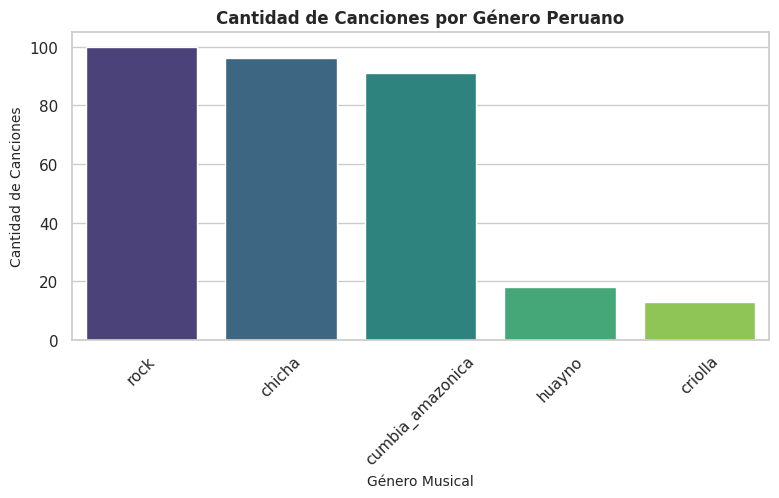

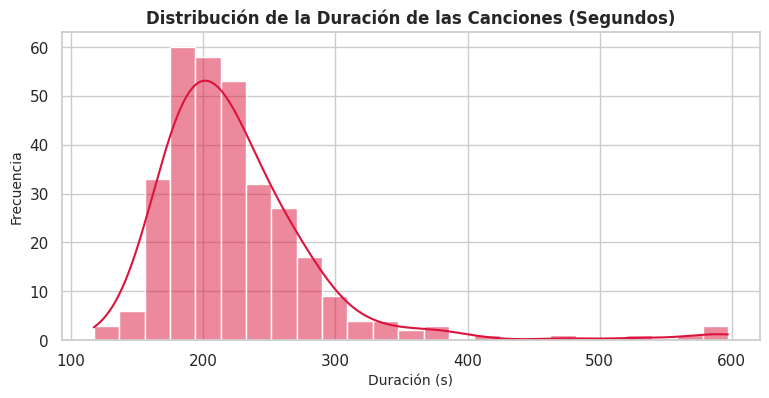

In [10]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Configurar estilo de gráficos
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 4)

# Convertir a pandas df para analisis con graficos
print("--- 1. EDA Estructurado (Metadatos) ---")
df_eda = audio_con_metadatos.to_pandas()

# Contar canciones por género
plt.figure(figsize=(9, 4))
ax = sns.countplot(data=df_eda, x='genre', palette='viridis', order=df_eda['genre'].value_counts().index)
plt.title('Cantidad de Canciones por Género Peruano', fontsize=12, fontweight='bold')
plt.xlabel('Género Musical', fontsize=10)
plt.ylabel('Cantidad de Canciones', fontsize=10)
plt.xticks(rotation=45)
plt.show()

# Distribución de la duración de las canciones
# Calculamos la duración dividiendo el tamaño del array entre su tasa de muestreo
duraciones = [len(item['audio']['array']) / item['audio']['sampling_rate'] for item in audio_con_metadatos]
plt.figure(figsize=(9, 4))
sns.histplot(duraciones, bins=25, kde=True, color='crimson')
plt.title('Distribución de la Duración de las Canciones (Segundos)', fontsize=12, fontweight='bold')
plt.xlabel('Duración (s)', fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.show()


### Análisis Exploratorio de Datos (EDA) - Catálogo y Acústica Musical

#### 1. EDA Estructurado (Metadatos)
* **Volumen y Cobertura:** El dataset consolidado consta de **318 canciones válidas** provenientes del catálogo maestro (`catalog.json`), abarcando cinco géneros representativos de la música peruana: **rock**, **chicha**, **cumbia amazónica**, **huayno** y **criolla**.
* **Distribución por Géneros:** Se observa una presencia equilibrada liderada por el rock (~100 temas), chicha (~96 temas) y cumbia amazónica (~91 temas), complementada por muestras esenciales de huayno y música criolla.
* **Duración de los Temas:** La gran mayoría de los registros se concentra en un rango comercial estándar de **180 a 250 segundos (3 a 4 minutos)**, identificándose valores atípicos que superan los 500 segundos correspondientes a popurrís o mezclas extensas.

Generando EDA acústico completo para los 5 géneros: ['huayno', 'cumbia_amazonica', 'chicha', 'criolla', 'rock']

--- Género: HUAYNO ---
Canción de muestra: Que linda flor - Silverio Urbina



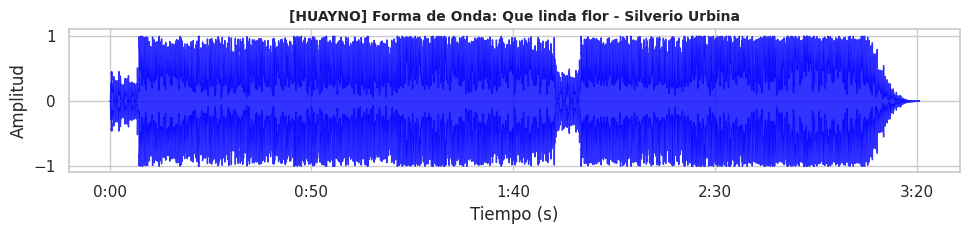

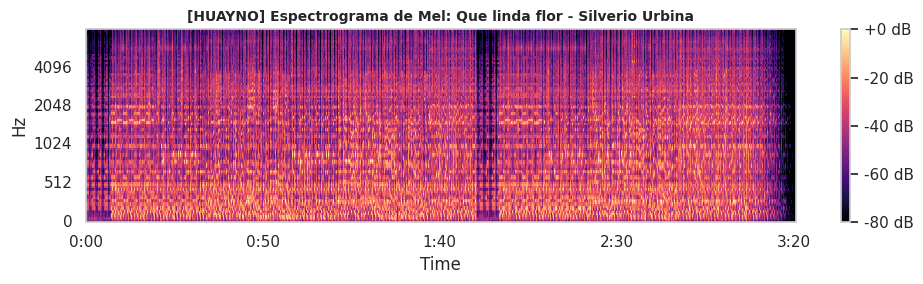



--- Género: CUMBIA_AMAZONICA ---
Canción de muestra: Los Mirlos - La Danza de Los Mirlos / Cumbia de Los Pajaritos (Video Oficial HD Remaster) (Infopesa)



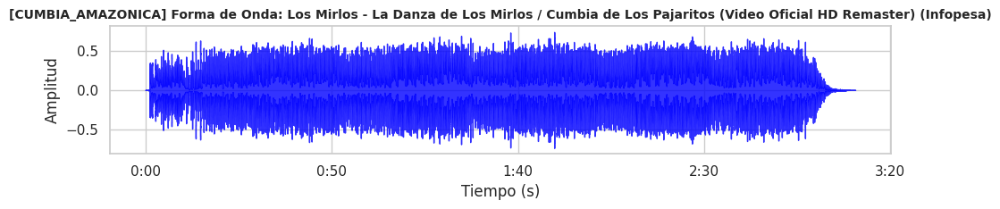

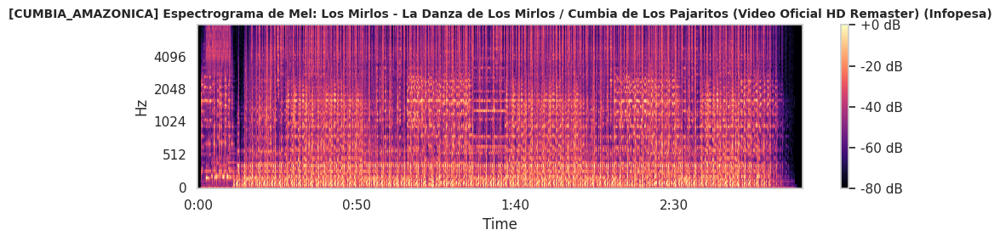



--- Género: CHICHA ---
Canción de muestra: Porque Te Amo



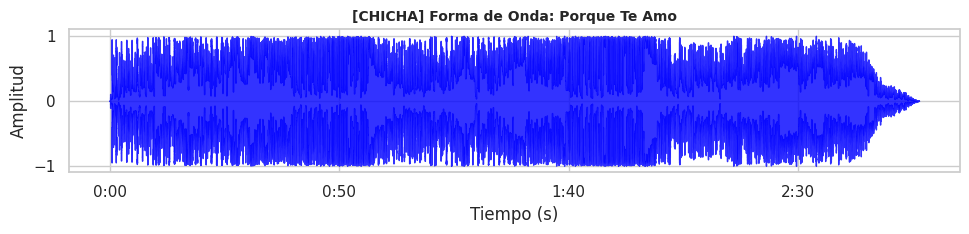

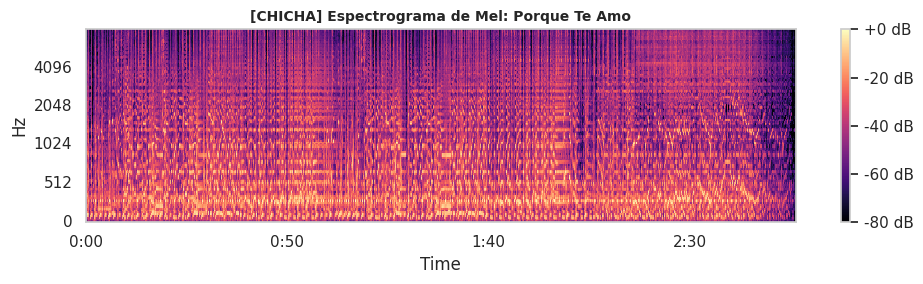



--- Género: CRIOLLA ---
Canción de muestra: Popurri de Valses: Y Se Llama Perú / Contigo Perú / Ésta Es Mi Tierra



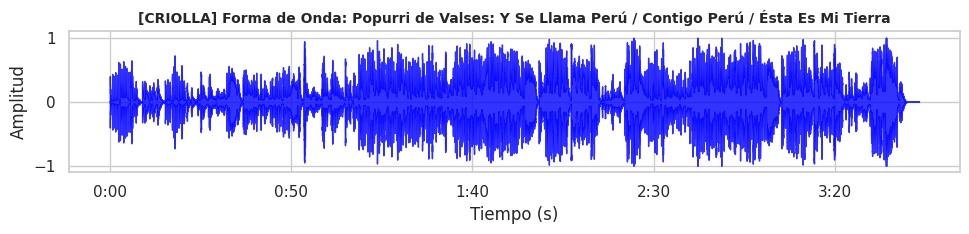

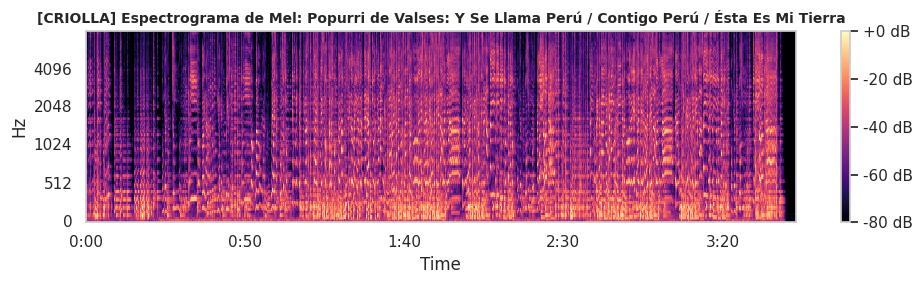



--- Género: ROCK ---
Canción de muestra: Christian Meier - Quédate (Video oficial)



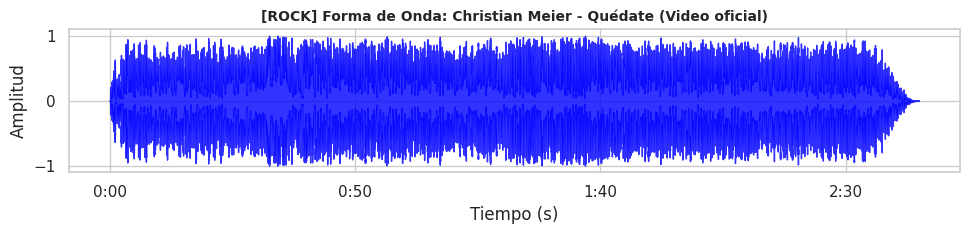

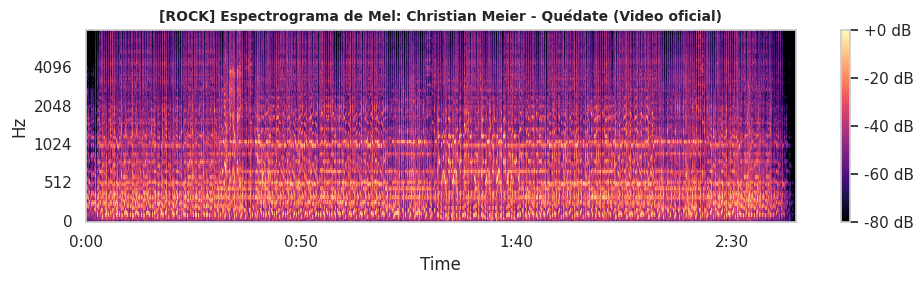

In [11]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Lista de géneros únicos presentes en el dataset
df_eda = audio_con_metadatos.to_pandas()
generos_unicos = df_eda['genre'].unique()

print(f"Generando EDA acústico completo para los {len(generos_unicos)} géneros: {list(generos_unicos)}\n")

for g in generos_unicos:
    # Buscar el primer ejemplo que pertenezca a este género en el dataset de Hugging Face
    muestra_genero = next(item for item in audio_con_metadatos if item['genre'] == g)

    titulo = muestra_genero['title']
    y = muestra_genero['audio']['array']
    sr = muestra_genero['audio']['sampling_rate']

    print(f"--- Género: {g.upper()} ---")
    print(f"Canción de muestra: {titulo}\n")

    # 1. Gráfico de Forma de Onda y Amplitud
    plt.figure(figsize=(10, 2.5))
    librosa.display.waveshow(y, sr=sr, alpha=0.8, color='blue')
    plt.title(f'[{g.upper()}] Forma de Onda: {titulo}', fontsize=10, fontweight='bold')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.tight_layout()
    plt.show()

    # 2. Gráfico de Espectrograma de Mel
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)

    plt.figure(figsize=(10, 3))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000, cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'[{g.upper()}] Espectrograma de Mel: {titulo}', fontsize=10, fontweight='bold')
    plt.tight_layout()
    plt.show()

    print("\n" + "="*60 + "\n")

#### 2. EDA Acústico (Procesamiento de Señal)
* **Forma de Onda y Amplitud:** El análisis temporal de las señales (`.wav`) permite verificar la correcta carga de la amplitud y la estructura dinámica de las pistas, identificando transiciones, pausas y variaciones de volumen características de cada interpretación.
* **Espectrogramas de Mel (Frecuencia vs. Tiempo):**
  * La transformación a espectrogramas revela las firmas de frecuencia únicas de cada género musical.
  * Se identifican patrones energéticos diferenciados en el eje de frecuencias ($Hz$): texturas densas en frecuencias medias-altas para la chicha y el rock, y patrones rítmicos marcados y estables en la cumbia amazónica y el huayno.
* **Implicancia para el Modelo:** Esta unicidad visual y acústica en los espectrogramas valida la viabilidad técnica para proceder con la extracción de picos espectrales (*constellation mapping*), base fundamental para el diseño de huellas dactilares acústicas (*audio fingerprinting*) en el sistema tipo Shazam.

In [12]:
print("--- Estadísticas descriptivas de la duración de las canciones ---")
df_eda['duration_seconds'] = [len(item['audio']['array']) / item['audio']['sampling_rate'] for item in audio_con_metadatos]
display(df_eda['duration_seconds'].describe())

--- Estadísticas descriptivas de la duración de las canciones ---


,duration_seconds
count,318.000000
mean,225.707824
std,65.326378
min,117.191111
25%,185.504218
50%,212.996644
75%,249.045624
max,597.054694


/tmp/ipykernel_1631/391625203.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_eda, x='genre', y='duration_seconds', palette='viridis')


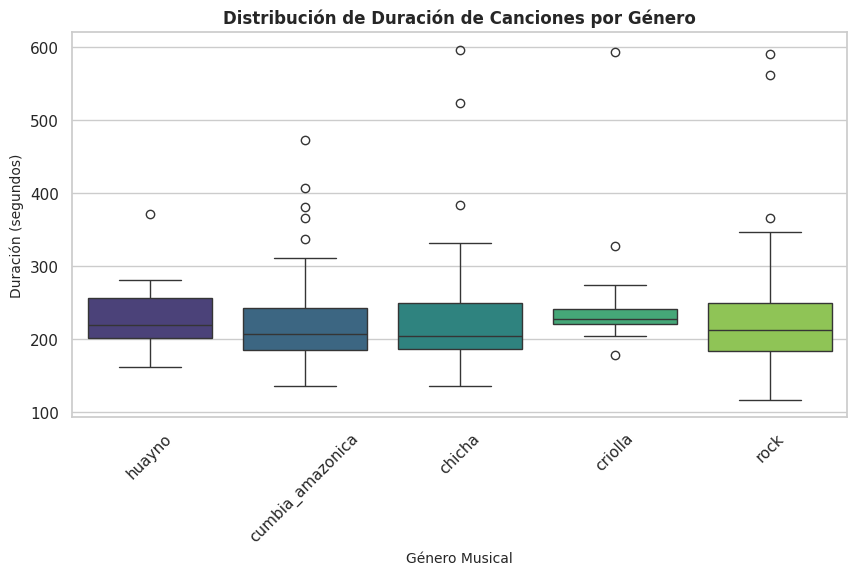

In [13]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_eda, x='genre', y='duration_seconds', palette='viridis')
plt.title('Distribución de Duración de Canciones por Género', fontsize=12, fontweight='bold')
plt.xlabel('Género Musical', fontsize=10)
plt.ylabel('Duración (segundos)', fontsize=10)
plt.xticks(rotation=45)
plt.show()

## Outliers en la duración de las canciones

In [14]:
Q1 = df_eda['duration_seconds'].quantile(0.25)
Q3 = df_eda['duration_seconds'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df_eda[(df_eda['duration_seconds'] < lower_bound) | (df_eda['duration_seconds'] > upper_bound)]

print(f"Q1: {Q1:.2f} segundos")
print(f"Q3: {Q3:.2f} segundos")
print(f"IQR: {IQR:.2f} segundos")
print(f"Límite Inferior para Outliers: {lower_bound:.2f} segundos")
print(f"Límite Superior para Outliers: {upper_bound:.2f} segundos")

print("\n--- Canciones identificadas como outliers por duración ---")
display(outliers[['title', 'genre', 'duration_seconds']].sort_values(by='duration_seconds', ascending=False))

Q1: 185.50 segundos
Q3: 249.05 segundos
IQR: 63.54 segundos
Límite Inferior para Outliers: 90.19 segundos
Límite Superior para Outliers: 344.36 segundos

--- Canciones identificadas como outliers por duración ---


,title,genre,duration_seconds
113,CHACALON SIEMPRE TE AMARE,chicha,597.054694
213,Mal Paso,criolla,593.014422
288,Pelo Madueño - ALMA DE 80's,rock,591.365805
264,Mar de Copas - Suna (Versión 2024 Restaurado),rock,561.644263
168,Corazón,chicha,524.329796
29,Los Mirlos - Lamento en la Selva (Infopesa),cumbia_amazonica,472.990476
88,Sonido 2000 - Lágrimas Tristes (Infopesa),cumbia_amazonica,406.836825
141,Sola,chicha,383.593651
67,Los Mirlos - La Danza del Lorito (Infopesa),cumbia_amazonica,381.666395
11,LA MOSCA DEL FOLKLOR - EL AMOR SE PAGA CON AMOR,huayno,371.194195


## Distribución de la duración de las canciones

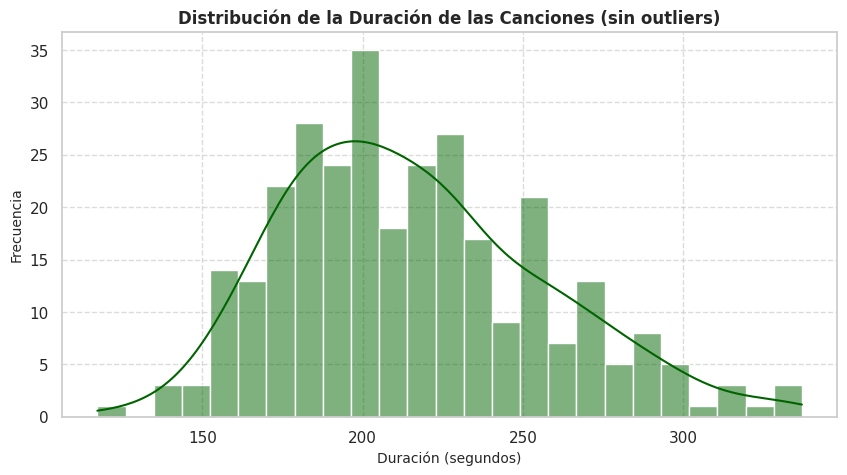

In [15]:
df_filtered = df_eda[~((df_eda['duration_seconds'] < lower_bound) | (df_eda['duration_seconds'] > upper_bound))]

plt.figure(figsize=(10, 5))
sns.histplot(df_filtered['duration_seconds'], bins=25, kde=True, color='darkgreen')
plt.title('Distribución de la Duración de las Canciones (sin outliers)', fontsize=12, fontweight='bold')
plt.xlabel('Duración (segundos)', fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

## Extracción de Características Acústicas. Tempo y Tasa de Cruce Cero (Zero Crossing Rate)

Que es Zero-Crossing Rate?: Es la frecuencia con la que una señal cambia de signo. Las veces que cruza el eje horizontal o nivel cero (pasa de valor positivo a negativo o de negativo a positivo) por unidad de tiempo.

Eso nos sirve para poder identificar inicialmente que tan ruidosa es una canción... así podemos diferenciar entre los géneros de música. Eso nos ayudaría a reducir un poco el universo de canciones en las cuales buscar para identificar la canción.

In [16]:
tempos = []
zcrs = []

for item in audio_con_metadatos:
    y = item['audio']['array']
    sr = item['audio']['sampling_rate']

    # Calcular Tempo
    onset_env = librosa.onset.onset_detect(y=y, sr=sr)
    tempo, _ = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr)
    tempos.append(tempo)

    # Calcular Tasa de Cruce por Cero (ZCR)
    zcrs.append(librosa.feature.zero_crossing_rate(y=y).mean())

# Añadir al df
df_eda['tempo'] = tempos
df_eda['zero_crossing_rate'] = zcrs

print("--- DataFrame con nuevas características acústicas ---")
display(df_eda[['title', 'genre', 'duration_seconds', 'tempo', 'zero_crossing_rate']].head())

--- DataFrame con nuevas características acústicas ---


,title,genre,duration_seconds,tempo,zero_crossing_rate
0,Que linda flor - Silverio Urbina,huayno,200.643628,[123.046875],0.104832
1,EUSEBIO CHATO GRADOS - EL PIO PIO,huayno,194.815420,[123.046875],0.114988
2,rosita de espinar suspiros de amor,huayno,281.309751,[123.046875],0.161516
3,Los Huaycheños Mix Pandilla,huayno,197.857234,[123.046875],0.138372
4,EUSEBIO CHATO GRADOS EN MACHU PICCHU - HUAYLAS...,huayno,254.212063,[123.046875],0.157253


## Correlación de características numéricas

--- Matriz de Correlación --- 


,duration_seconds,tempo,zero_crossing_rate
duration_seconds,1.000000,-0.070152,0.076594
tempo,-0.070152,1.000000,-0.103904
zero_crossing_rate,0.076594,-0.103904,1.000000


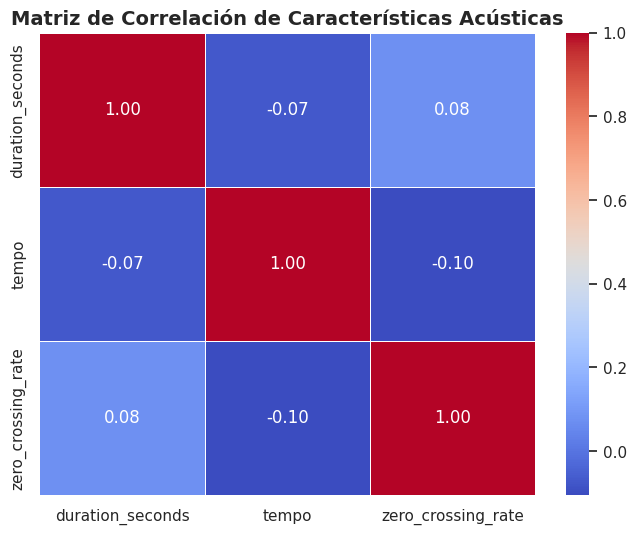

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# SOlo columnas relevantes
df_numeric = df_eda[['duration_seconds', 'tempo', 'zero_crossing_rate']]

# Matriz
correlation_matrix = df_numeric.corr()

print("--- Matriz de Correlación --- ")
display(correlation_matrix)

# Show matriz (mapa calor)
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Matriz de Correlación de Características Acústicas', fontsize=14, fontweight='bold')
plt.show()

## Conclusiones y Mejoras

### Conclusiones
*   Dataset Robusto: Contamos con 318 canciones válidas de cinco géneros peruanos, con una distribución equilibrada, ideal para el desarrollo de un sistema de audio fingerprinting.
*   Duración Estándar: La mayoría de las canciones tienen una duración estándar (150-300s), con la identificación de 13 outliers de mayor duración que podrían ser mixes.
*   Viabilidad Acústica: Los análisis de formas de onda y espectrogramas de Mel confirman patrones acústicos distintivos entre géneros, validando la capacidad del dataset para el audio fingerprinting.
*   Características Independientes: Las nuevas características tempo y zero_crossing_rate muestran baja correlación entre sí y con la duración de la canción, lo que indica que aportan información única y no redundante.


### Mejoras y Próximos Pasos
*   Extracción de Más Características: Incorporar más Espectogramas de Mel, características de croma, energía espectral, etc., para enriquecer el modelo.
*   Preprocesamiento: Implementar normalización y escalado de características antes del modelado.
*   Manejo de Outliers: Decidir el tratamiento específico para los outliers de duración (exclusión, segmentación, etc.).
*   Segmentación de Audio: Desarrollar una estrategia para dividir las canciones en fragmentos más pequeños, crucial para el audio fingerprinting.
*   Algoritmo de Fingerprinting: El siguiente paso fundamental es diseñar e implementar el algoritmo de audio fingerprinting mencionado anteriormente.